<H1 style="text-align: center">ECMM426 - Computer Vision</H1>
<H1 style="text-align: center">Workshop 8</H1>
<H1 style="text-align: center">Object Detection on Raccoon Dataset</H1>
<H1 style="text-align: center">Single-Class Setting</H1>



For this workshop, we will be finetuning a pre-trained [Faster R-CNN](https://arxiv.org/abs/1506.01497) model on the [Raccoon dataset](https://github.com/experiencor/raccoon_dataset.git) for Raccoon detection task. It contains total 200 images containing only one annotated object. We need to use the `pycocotools`, this library will be used for computing the evaluation metrics following the [Microsoft COCO](https://cocodataset.org/#home) metric for intersection over union. Also some other functions from the `torchvision` package. More detailed and complicated version of object detector can be found [here](https://github.com/facebookresearch/detectron2).

###Imports

In [4]:
import os
import numpy as np
import torch
import torchvision
import pycocotools
import pandas as pd
from PIL import Image
from torch.utils.data import Subset, DataLoader
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
print(torchvision.__version__)

0.16.0+cu121


###Dataset
This dataset is available [here](https://github.com/experiencor/raccoon_dataset), and was collected from Google and Pixabay. In total, there are 200 images, each containing an annotation of Raccoon. In this workshop, 160 images are used for training and 40 for validation.

In [5]:
!git clone https://github.com/experiencor/raccoon_dataset.git
class_str2num = {'raccoon': 1}
class_num2str = {v: k for k, v in class_str2num.items()}
antns = sorted(os.listdir('raccoon_dataset/annotations'))

Cloning into 'raccoon_dataset'...
remote: Enumerating objects: 646, done.
remote: Total 646 (delta 0), reused 0 (delta 0), pack-reused 646
Receiving objects: 100% (646/646), 48.00 MiB | 15.72 MiB/s, done.
Resolving deltas: 100% (412/412), done.


###Annotations
Detection and segmentation datasets come with annotation files containing information about the object location (bounding box), pixel wise position etc. Below we can consider an example of annotation file from the Raccoon dataset. The format of the annotation file is exactly the same as the ones from [PASCAL VOC dataset](http://host.robots.ox.ac.uk/pascal/VOC/voc2007/).
```
<annotation verified="yes">
	<folder>images</folder>
	<filename>raccoon-1.jpg</filename>
	<path>/Users/datitran/Desktop/raccoon/images/raccoon-1.jpg</path>
	<source>
		<database>Unknown</database>
	</source>
	<size>
		<width>650</width>
		<height>417</height>
		<depth>3</depth>
	</size>
	<segmented>0</segmented>
	<object>
		<name>raccoon</name>
		<pose>Unspecified</pose>
		<truncated>0</truncated>
		<difficult>0</difficult>
		<bndbox>
			<xmin>81</xmin>
			<ymin>88</ymin>
			<xmax>522</xmax>
			<ymax>408</ymax>
		</bndbox>
	</object>
</annotation>
```

###XML Parser
We have written the following `XML` parser function for reading the annotation file.

In [6]:
import xml.etree.ElementTree as ET
def parse_xml(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    bboxes = []
    labels = []
    filename = root.find('filename').text
    for boxes in root.iter('object'):
        ymin, xmin, ymax, xmax = None, None, None, None
        ymin = int(boxes.find("bndbox/ymin").text)
        xmin = int(boxes.find("bndbox/xmin").text)
        ymax = int(boxes.find("bndbox/ymax").text)
        xmax = int(boxes.find("bndbox/xmax").text)
        box = [xmin, ymin, xmax, ymax]
        bboxes.append(box)
        labels.append(int(class_str2num[boxes.find("name").text]))
    return filename, bboxes, labels

###Example of Images

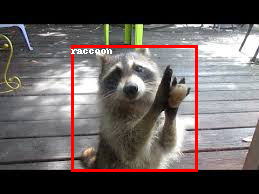

In [7]:
from PIL import Image, ImageDraw
idx = np.random.randint(len(antns))
filename, boxes, labels = parse_xml(os.path.join('raccoon_dataset/annotations', antns[idx]))
image = Image.open(os.path.join('raccoon_dataset/images', filename))
draw = ImageDraw.Draw(image)
for i, ibox in enumerate(boxes):
    draw.rectangle([(ibox[0], ibox[1]), (ibox[2], ibox[3])], outline='red', width=3)
    draw.text((ibox[0], ibox[1]), text=class_num2str[labels[i]])
image

Clone the PyTorch vision repo and copy some python files containing implementation on evaluation, transformations, loss function etc.

In [8]:
!git clone https://github.com/pytorch/vision.git
!cp vision/references/detection/utils.py ./
!cp vision/references/detection/transforms.py ./
!cp vision/references/detection/coco_eval.py ./
!cp vision/references/detection/engine.py ./
!cp vision/references/detection/coco_utils.py ./
from engine import train_one_epoch, evaluate
import utils
import transforms as TF

Cloning into 'vision'...
remote: Enumerating objects: 469758, done.
remote: Counting objects: 100% (50216/50216), done.
remote: Compressing objects: 100% (2321/2321), done.
remote: Total 469758 (delta 47952), reused 50028 (delta 47819), pack-reused 419542
Receiving objects: 100% (469758/469758), 921.67 MiB | 16.51 MiB/s, done.
Resolving deltas: 100% (437040/437040), done.


###Data Loader
An example of PyTorch data generator for object detector can be found [here](https://github.com/sgrvinod/a-PyTorch-Tutorial-to-Object-Detection/blob/master/datasets.py) or [here](https://pytorch.org/tutorials/intermediate/torchvision_tutorial.html). A simplified version of the data generator can be found below.

In [9]:
class RaccoonDataset(torch.utils.data.Dataset):
    def __init__(self, root, transforms=None):
        self.root = root
        self.transforms = transforms
        self.antns = sorted(os.listdir(os.path.join(root, 'annotations')))

    def __getitem__(self, idx):
        # load annotation
        filename, boxes, labels = parse_xml(os.path.join(self.root, 'annotations', self.antns[idx]))
        # load image
        img_path = os.path.join(self.root, 'images', filename)
        img = Image.open(img_path).convert('RGB')
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        num_objs = boxes.shape[0]
        #classes
        labels = torch.tensor(labels, dtype=torch.int64)
        image_id = int(torch.tensor([idx]))
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])

        iscrowd = torch.zeros((num_objs,), dtype=torch.int64)
        w,h = img.size
        boxes[:, 0::2].clamp_(min=0, max=w)
        boxes[:, 1::2].clamp_(min=0, max=h)
        keep = (boxes[:, 3]>boxes[:, 1]) & (boxes[:, 2]>boxes[:, 0])
        boxes = boxes[keep]
        labels = labels[keep]
        area = area[keep]
        iscrowd = iscrowd[keep]

        target = {}
        target['boxes'] = boxes
        target['labels'] = labels
        target['image_id'] = image_id
        target['area'] = area
        target['iscrowd'] =iscrowd
        if self.transforms is not None:
            img, target = self.transforms(img, target)
        return img, target

    def __len__(self):
        return len(self.antns)

###Data Instance

In [10]:
dataset = RaccoonDataset(root='raccoon_dataset')
dataset.__getitem__(8)

(<PIL.Image.Image image mode=RGB size=269x187>,
 {'boxes': tensor([[ 31.,  21., 226., 146.]]),
  'labels': tensor([1]),
  'image_id': 8,
  'area': tensor([24375.]),
  'iscrowd': tensor([0])})

###Model
In this workshop, we will be using [Faster R-CNN](https://arxiv.org/abs/1506.01497) which is a model that predicts both bounding boxes and class scores for potential objects in the image. The detection models available within PyTorch can be found [here](https://pytorch.org/vision/stable/models.html#object-detection-instance-segmentation-and-person-keypoint-detection).

![Faster R-CNN](https://raw.githubusercontent.com/pytorch/vision/temp-tutorial/tutorials/tv_image03.png)

Check the PyTorch implementation of Faster R-CNN with ResNet-50 backbone [here](https://github.com/pytorch/vision/blob/master/torchvision/models/detection/faster_rcnn.py)

In [11]:
def get_model(num_classes):
    # load an object detection model pre-trained on MS COCO
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
    # get the number of input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    # replace the pre-trained head with a new on
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
    return model

###Transformations
We only use random horizontal flip transformation. One can use some other transformations, such as affine etc.

In [12]:
def get_transform(train):
    transforms = []
    # converts the image, a PIL image, into a PyTorch Tensor
    #transforms.append(TF.ToTensor())
    transforms.append(TF.PILToTensor())
    transforms.append(TF.ToDtype(torch.float))
    if train:
        # during training, randomly flip the training images
        # and ground-truth for data augmentation
        transforms.append(TF.RandomHorizontalFlip(0.5))
    return TF.Compose(transforms)

###Initialization of Dataset and Data Loader

In [13]:
train_dataset = RaccoonDataset(root='raccoon_dataset', transforms=get_transform(train=True))
test_dataset = RaccoonDataset(root='raccoon_dataset', transforms=get_transform(train=False))
# dataset
indices = torch.randperm(len(train_dataset)).tolist()
train_dataset = Subset(train_dataset, indices[:-40])
test_dataset = Subset(test_dataset, indices[-40:])
# data loader
train_loader = DataLoader(train_dataset, batch_size=2, shuffle=True, num_workers=2, collate_fn=utils.collate_fn)
test_loader = DataLoader(test_dataset, batch_size=2, shuffle=False, num_workers=2, collate_fn=utils.collate_fn)
print("We have: {} examples, {} are training and {} testing".format(len(indices), len(train_dataset), len(test_dataset)))

We have: 200 examples, 160 are training and 40 testing


###Initialization of Model and Optimizer
In this training, they recommend to use learning rate scheduler, more details on it can be found [here](https://pytorch.org/docs/stable/optim.html).

In [16]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
# our dataset has two classes only - raccoon and not racoon
num_classes = 2
# get the model using our helper function
model = get_model(num_classes)
# move model to the right device
model.to(device)
# construct an optimizer
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.00001, momentum=0.9, weight_decay=0.0005)
# and a learning rate scheduler which decreases the learning rate by # 10x every 3 epochs
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)

###Train and Test Loop
Read more about the `train_one_epoch()` and `evaluate()` functions [here](https://github.com/pytorch/vision/tree/master/references/detection). Details on the evaluation metrics, different parameters and following verbose can be found [here](https://cocodataset.org/#detection-eval). In this training, it is recommended to use learning rate scheduler and learning rate warm-up, more details on it can be found [here](https://pytorch.org/docs/stable/optim.html).

In [17]:
# let's train it for 10 epochs
num_epochs = 10
for epoch in range(num_epochs):
    # train for one epoch, printing every 10 iterations
    train_one_epoch(model, optimizer, train_loader, device, epoch, print_freq=10)
    # evaluate on the test dataset
    evaluate(model, test_loader, device=device)
    # update the learning rate
    lr_scheduler.step()

Epoch: [0]  [ 0/80]  eta: 0:01:01  lr: 0.000000  loss: 118.6316 (118.6316)  loss_classifier: 39.4867 (39.4867)  loss_box_reg: 0.9069 (0.9069)  loss_objectness: 77.5847 (77.5847)  loss_rpn_box_reg: 0.6532 (0.6532)  time: 0.7629  data: 0.1067  max mem: 4198
Epoch: [0]  [10/80]  eta: 0:00:42  lr: 0.000001  loss: 12.6549 (34.2754)  loss_classifier: 3.5958 (16.2707)  loss_box_reg: 1.7825 (1.8396)  loss_objectness: 3.9152 (15.0295)  loss_rpn_box_reg: 1.0340 (1.1356)  time: 0.6101  data: 0.0166  max mem: 5111
Epoch: [0]  [20/80]  eta: 0:00:36  lr: 0.000003  loss: 12.7984 (25.8179)  loss_classifier: 5.0796 (12.5619)  loss_box_reg: 2.1848 (2.6099)  loss_objectness: 2.4968 (9.2912)  loss_rpn_box_reg: 1.2387 (1.3549)  time: 0.5980  data: 0.0078  max mem: 5407
Epoch: [0]  [30/80]  eta: 0:00:30  lr: 0.000004  loss: 9.2188 (19.8437)  loss_classifier: 2.6702 (9.0097)  loss_box_reg: 2.4111 (2.5210)  loss_objectness: 2.0091 (7.0524)  loss_rpn_box_reg: 0.7952 (1.2606)  time: 0.6012  data: 0.0077  max me

###Qualitative Results

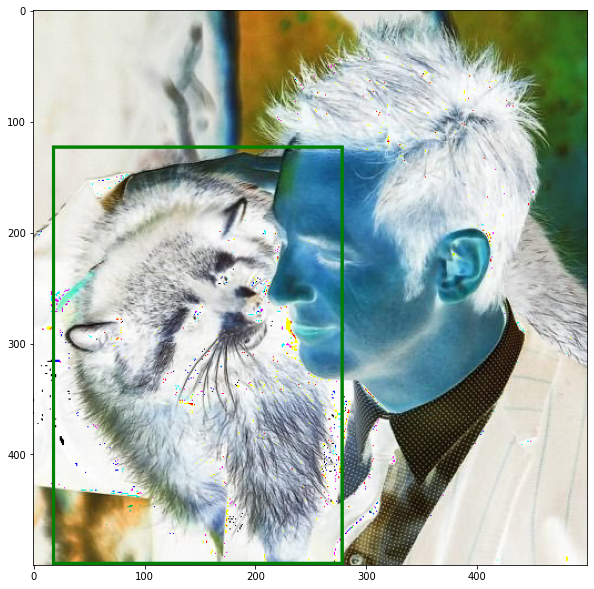

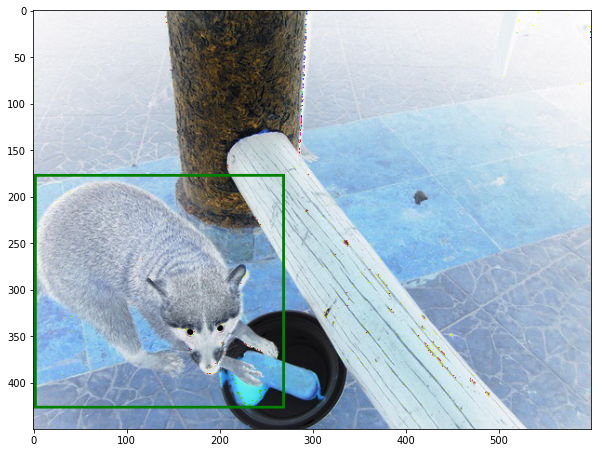

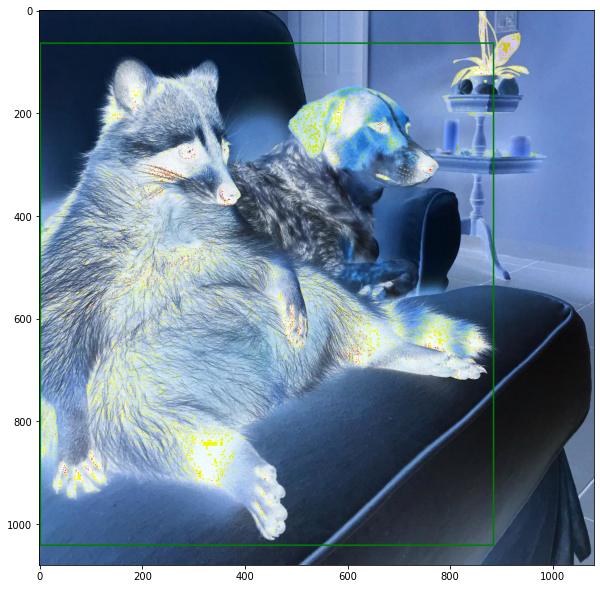

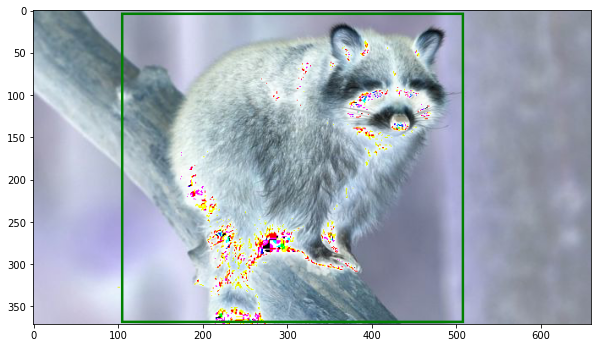

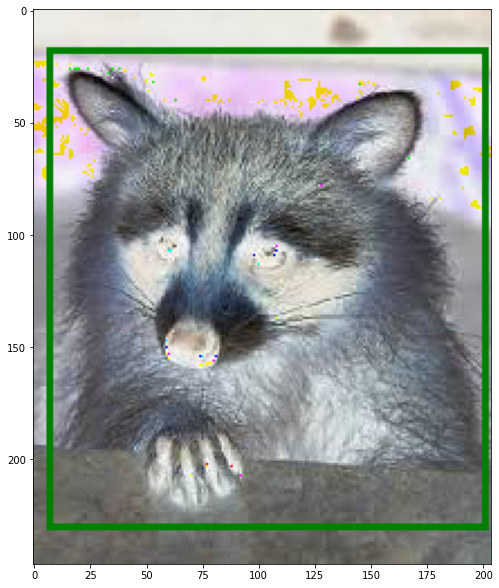

...

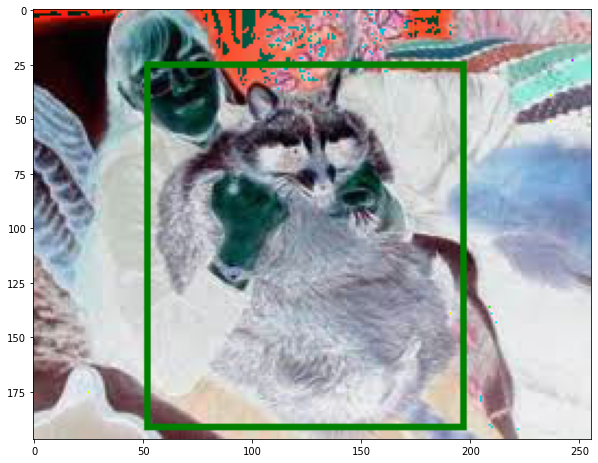

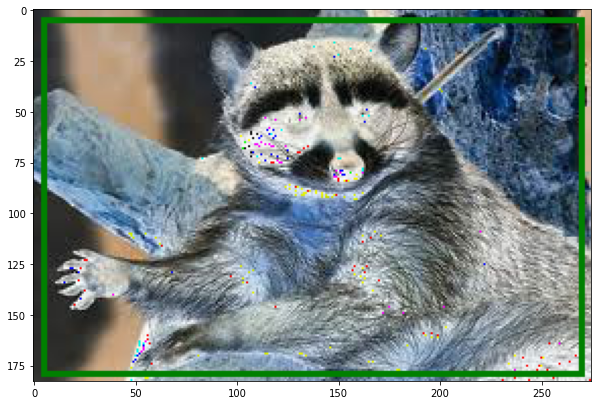

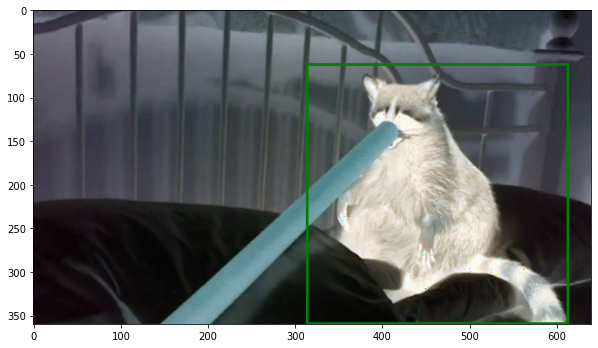

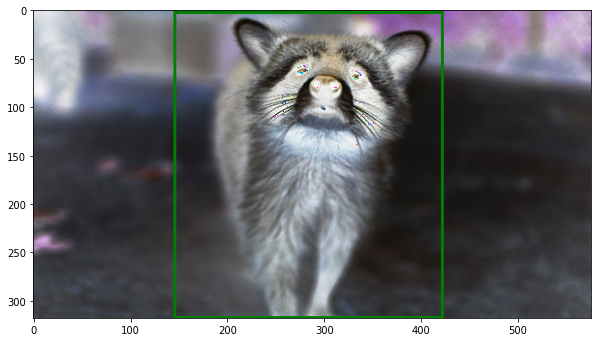

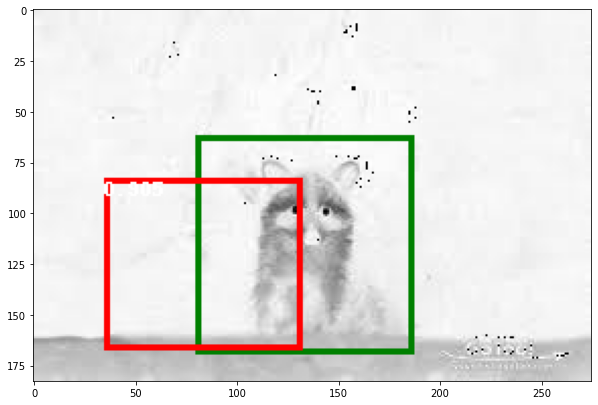

In [18]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (10.0, 10.0)
plt.rcParams['figure.dpi'] = 72
model = model.cpu()
model.eval()
for i in range(len(test_dataset)):
    img, _ = test_dataset[i]
    label_boxes = np.array(test_dataset[i][1]['boxes'])
    with torch.no_grad():
        prediction = model([img])
    image = Image.fromarray(img.mul(255).permute(1, 2, 0).byte().numpy())
    draw = ImageDraw.Draw(image)
    # draw groundtruth
    for elem in range(len(label_boxes)):
        draw.rectangle([(label_boxes[elem][0], label_boxes[elem][1]), (label_boxes[elem][2], label_boxes[elem][3])], outline ="green", width =3)
    for element in range(len(prediction[0]['boxes'])):
        boxes = prediction[0]['boxes'][element].cpu().numpy()
        score = np.round(prediction[0]['scores'][element].cpu().numpy(), decimals= 4)
        if score > 0.8:
            draw.rectangle([(boxes[0], boxes[1]), (boxes[2], boxes[3])], outline ='red', width =3)
            draw.text((boxes[0], boxes[1]), text = str(score))
    plt.imshow(image)
    plt.show()